In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')
import statsmodels.api as sm
from sklearn import linear_model
from tabulate import tabulate
import scipy.stats as stats

In [4]:
# Read the housing data
kchd = pd.read_csv('kc_house_data.csv')
kchd

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


In [5]:
kchd.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [6]:
kchd.tail()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287
21612,1523300157,20141015T000000,325000.0,2,0.75,1020,1076,2.0,0,0,...,7,1020,0,2008,0,98144,47.5941,-122.299,1020,1357


In [7]:
kchd.sample()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
4984,1443550020,20150506T000000,570000.0,4,2.5,2640,11816,2.0,0,0,...,8,2640,0,1999,0,98019,47.733,-121.968,2400,11816


In [8]:
kchd.describe(include='all')

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,...,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
unique,NaN,372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,20140623T000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,4.580302e+09,NaN,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,...,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,NaN,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,...,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,NaN,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,...,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,NaN,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,...,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,NaN,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,...,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,NaN,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,...,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000


In [9]:
kchd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

<Axes: title={'center': 'Correlation with price '}>

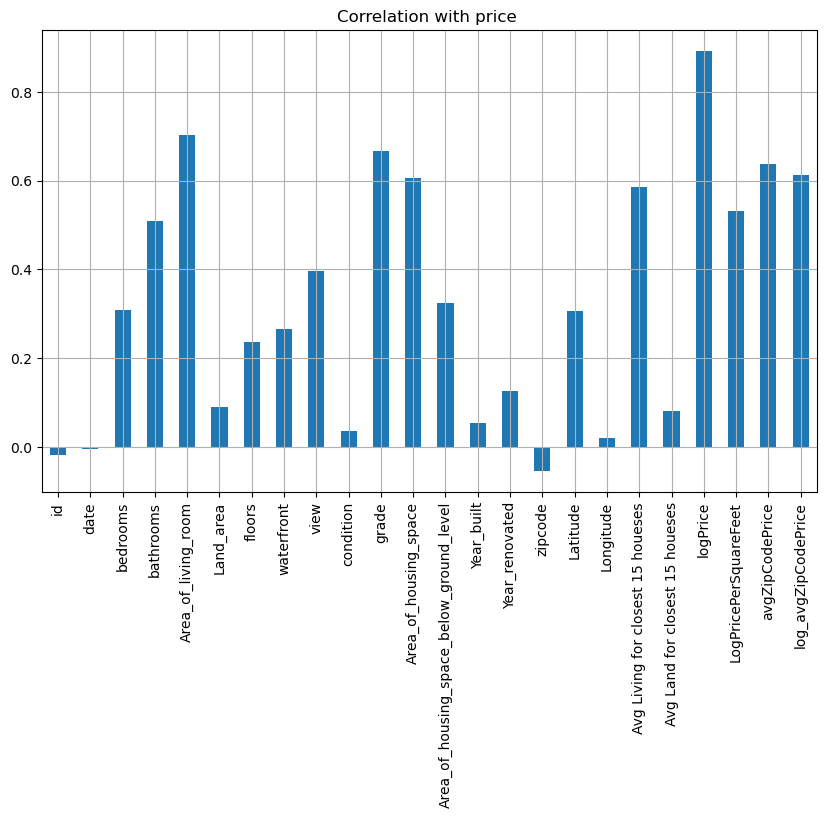

In [71]:
kchd.drop('price',axis=1).corrwith(kchd.price).plot(kind='bar',grid=True,figsize=(10,6),title="Correlation with price ")

In [72]:
#clean
#rename cols.
kchd.rename(columns={'sqft_living': 'Area_of_living_room', 
                     'sqft_lot': 'Land_area',
                     'sqft_above': 'Area_of_housing_space',
                     'sqft_basement': 'Area_of_housing_space_below_ground_level',
                     'yr_built': 'Year_built',
                     'yr_renovated': 'Year_renovated',
                     'lat': 'Latitude',
                     'long': 'Longitude',
                     'sqft_living15':'Avg Living for closest 15 houeses',
                     'sqft_lot15':'Avg Land for closest 15 houeses'}, inplace=True)
kchd

,id,date,price,bedrooms,bathrooms,Area_of_living_room,Land_area,floors,waterfront,view,...,Year_renovated,zipcode,Latitude,Longitude,Avg Living for closest 15 houeses,Avg Land for closest 15 houeses,logPrice,LogPricePerSquareFeet,avgZipCodePrice,log_avgZipCodePrice
0,7129300520,2014-10-13,221900.0,3,1,1180,5650,1,0,0,...,0,98178,47.5112,-122.257,1340,5650,12.309982,5.236712,310612.755725,12.646302
1,6414100192,2014-12-09,538000.0,3,2,2570,7242,2,0,0,...,1991,98125,47.7210,-122.319,1690,7639,13.195614,5.343953,469455.770732,13.059329
2,5631500400,2015-02-25,180000.0,2,1,770,10000,1,0,0,...,0,98028,47.7379,-122.233,2720,8062,12.100712,5.454322,462480.035336,13.044359
3,2487200875,2014-12-09,604000.0,4,3,1960,5000,1,0,0,...,0,98136,47.5208,-122.393,1360,5000,13.311329,5.730630,551688.673004,13.220739
4,1954400510,2015-02-18,510000.0,3,2,1680,8080,1,0,0,...,0,98074,47.6168,-122.045,1800,7503,13.142166,5.715617,685605.775510,13.438058
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,2014-05-21,360000.0,3,2,1530,1131,3,0,0,...,0,98103,47.6993,-122.346,1530,1509,12.793859,5.460836,584919.210963,13.279229
21609,6600060120,2015-02-23,400000.0,4,2,2310,5813,2,0,0,...,0,98146,47.5107,-122.362,1830,7200,12.899220,5.154217,359483.239583,12.792423
21610,1523300141,2014-06-23,402101.0,2,0,1020,1350,2,0,0,...,0,98144,47.5944,-122.299,1020,2007,12.904459,5.976901,594547.650146,13.295556
21611,291310100,2015-01-16,400000.0,3,2,1600,2388,2,0,0,...,0,98027,47.5345,-122.069,1410,1287,12.899220,5.521461,616990.592233,13.332609


In [11]:
kchd.isnull().sum()

id                                          0
date                                        0
price                                       0
bedrooms                                    0
bathrooms                                   0
Area_of_living_room                         0
Land_area                                   0
floors                                      0
waterfront                                  0
view                                        0
condition                                   0
grade                                       0
Area_of_housing_space                       0
Area_of_housing_space_below_ground_level    0
Year_built                                  0
Year_renovated                              0
zipcode                                     0
Latitude                                    0
Longitude                                   0
Avg Living for closest 15 houeses           0
Avg Land for closest 15 houeses             0
dtype: int64

In [12]:
# Drop rows with missing values
kchd.dropna(inplace=True)

In [13]:
kchd.duplicated().sum()

0

In [14]:
# Convert date column to datetime format
kchd['date'] = pd.to_datetime(kchd['date'])

#Convert the columns with a few unique values to categorical columns
#will not convert the following variables to categorical as they seems more like a continuous variable then a categorical variables:grade condition view 

In [15]:
# Convert selected columns to categorical:Convert the columns with a few unique values to categorical columns
cols_to_convert = ['floors', 'waterfront', 'view', 'condition', 'grade', 'zipcode']
kchd[cols_to_convert] = kchd[cols_to_convert].astype('category')


In [16]:
kchd['bathrooms'] = kchd['bathrooms'].astype(int)
kchd['floors'] = kchd['floors'].astype(int)

In [17]:
print ("\n Std for price =",kchd['price'].mean())


 Std for price = 540088.1417665294


identify high level correlations among the various variables, particularly those with correlations with price. 
Since the features zipcode, latitude, and longitude do not work with scatter plot well, we will deal with them separately.

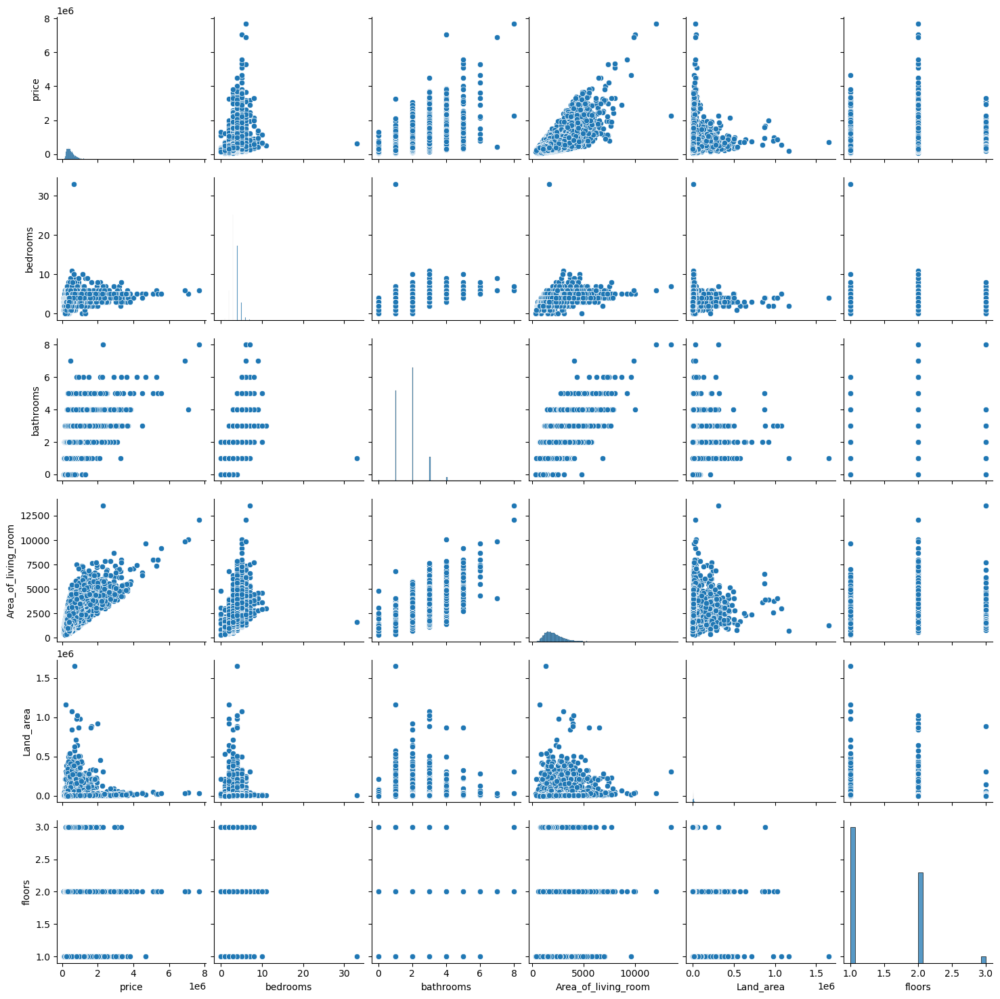

In [18]:
vars1 = ['price', 'date', 'bedrooms', 'bathrooms', 'Area_of_living_room', 'Land_area', 'floors', 'waterfront', 'view']
sns.pairplot(kchd[vars1])
plt.show()

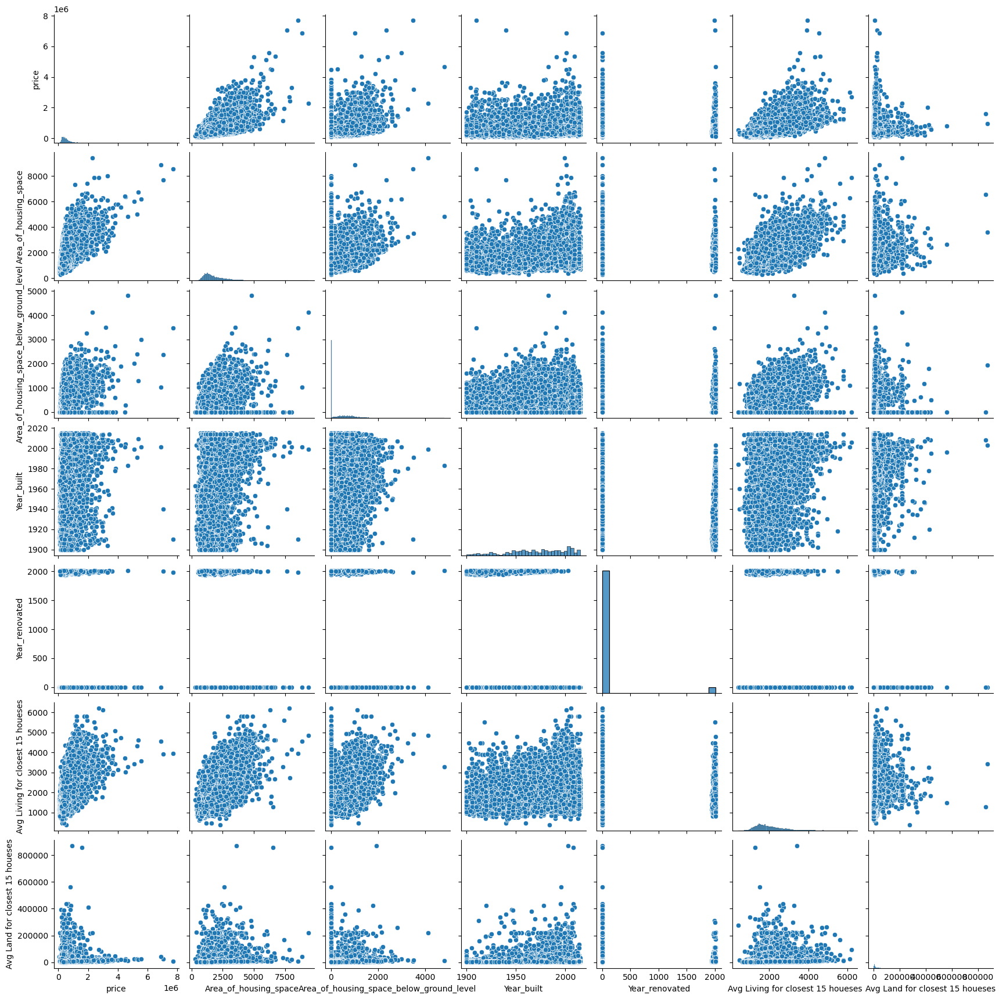

In [19]:
vars2 = ['price', 'condition', 'grade', 'Area_of_housing_space', 'Area_of_housing_space_below_ground_level', 'Year_built', 'Year_renovated', 'Avg Living for closest 15 houeses', 'Avg Land for closest 15 houeses']
# Plot the second subset of variables
sns.pairplot(kchd[vars2])
plt.show()

Based on the scatter plots abovethere are some corrlations among the following variables:

Price and bathrooms
Price and sqft_living
Bedrooms and bathrooms
Bedrooms and sqft_living
Price and grade
Price and sqft_above
Price and sqft_living15
Grade and sqft_above
Grade and sqft_basement
Grade and sqft_living15
sqft_above and sqft_basement

#there might be some correlations between all of the features related to sqft.

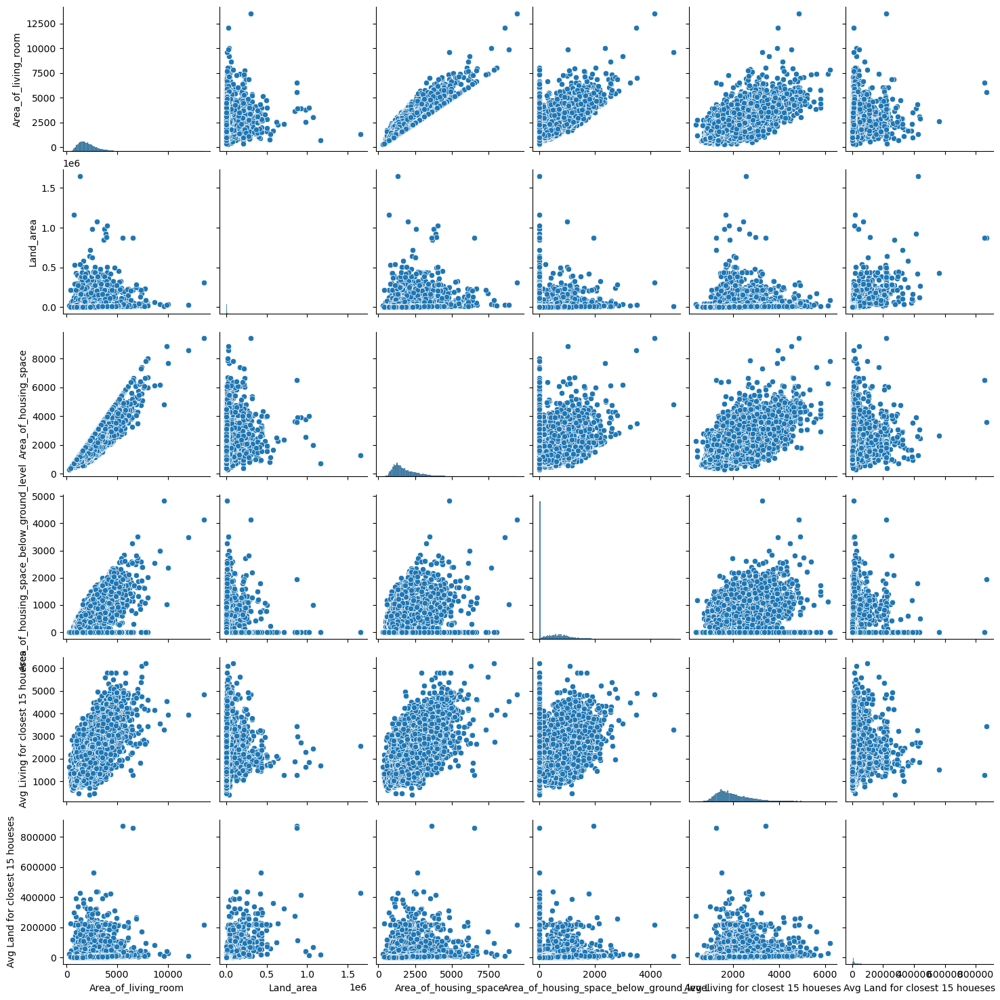

In [20]:
# Select the variables for plotting before fit
vars_to_plot = ["Area_of_living_room", "Land_area", "Area_of_housing_space", "Area_of_housing_space_below_ground_level", "Avg Living for closest 15 houeses", "Avg Land for closest 15 houeses"]

# Create pairplot for selected variables
sns.pairplot(kchd[vars_to_plot])
plt.show()


#correlation table above, we observe the following correlations (value > 0.5 or value < -0.5):

In [21]:
vars_for_correlation = ["price", "bedrooms", "bathrooms", 'Area_of_living_room', "Land_area", "Year_built", "Year_renovated", "Area_of_housing_space", "Area_of_housing_space_below_ground_level", "Avg Living for closest 15 houeses", "Avg Land for closest 15 houeses"]
# Calculate correlation matrix
correlation_matrix = kchd[vars_for_correlation].corr()
# Display correlation matrix
print(correlation_matrix)

                                             price  bedrooms  bathrooms  \
price                                     1.000000  0.308350   0.510072   
bedrooms                                  0.308350  1.000000   0.467452   
bathrooms                                 0.510072  0.467452   1.000000   
Area_of_living_room                       0.702035  0.576671   0.697875   
Land_area                                 0.089661  0.031703   0.085310   
Year_built                                0.054012  0.154178   0.433647   
Year_renovated                            0.126434  0.018841   0.060436   
Area_of_housing_space                     0.605567  0.477600   0.639933   
Area_of_housing_space_below_ground_level  0.323816  0.303093   0.250880   
Avg Living for closest 15 houeses         0.585379  0.391638   0.510049   
Avg Land for closest 15 houeses           0.082447  0.029244   0.080779   

                                          Area_of_living_room  Land_area  \
price                  

from correlation table the correlations:Price and bathrooms
Price and sqft_living
Price and sqft_above
Price and sqft_living15
Bedrooms and bathrooms
Bedrooms and sqft_living
Bathrooms and sqft_living
Bathrooms and yr_built
Bathrooms and sqft_above
Bathrooms and sqft_living15
sqft_living and sqft_above
sqft_living and sqft_living15
sqft_lot and sqft_lot15
sqft_above and sqft_living15

In [23]:
#it might help to predict price per square feet ('Area_of_living_room').

In [24]:
# Create additional variables
kchd['logPrice'] = np.log(kchd['price'])
kchd['LogPricePerSquareFeet'] = np.log(kchd['price'] / kchd['Area_of_living_room'])

In [25]:
#after adding "LogPricePerSquareFeet","logPrice" 
vars_for_correlation = ["price","logPrice","LogPricePerSquareFeet", "bedrooms", "bathrooms", 'Area_of_living_room', "Land_area", "Year_built", "Year_renovated", "Area_of_housing_space", "Area_of_housing_space_below_ground_level", "Avg Living for closest 15 houeses", "Avg Land for closest 15 houeses"]
# Calculate correlation matrix
correlation_matrix = kchd[vars_for_correlation].corr()
# Display correlation matrix
print(correlation_matrix)

                                             price  logPrice  \
price                                     1.000000  0.891654   
logPrice                                  0.891654  1.000000   
LogPricePerSquareFeet                     0.531349  0.607880   
bedrooms                                  0.308350  0.343561   
bathrooms                                 0.510072  0.511119   
Area_of_living_room                       0.702035  0.695341   
Land_area                                 0.089661  0.099622   
Year_built                                0.054012  0.080655   
Year_renovated                            0.126434  0.114498   
Area_of_housing_space                     0.605567  0.601801   
Area_of_housing_space_below_ground_level  0.323816  0.316970   
Avg Living for closest 15 houeses         0.585379  0.619312   
Avg Land for closest 15 houeses           0.082447  0.091592   

                                          LogPricePerSquareFeet  bedrooms  \
price                     

The correlation table indicates that the feature variables are (in general) better correlated to logPrice than the variable price. The correlation between logPricePerSquareFeet seems be worse than the correlation with price will see

#features relationships  to log(price)

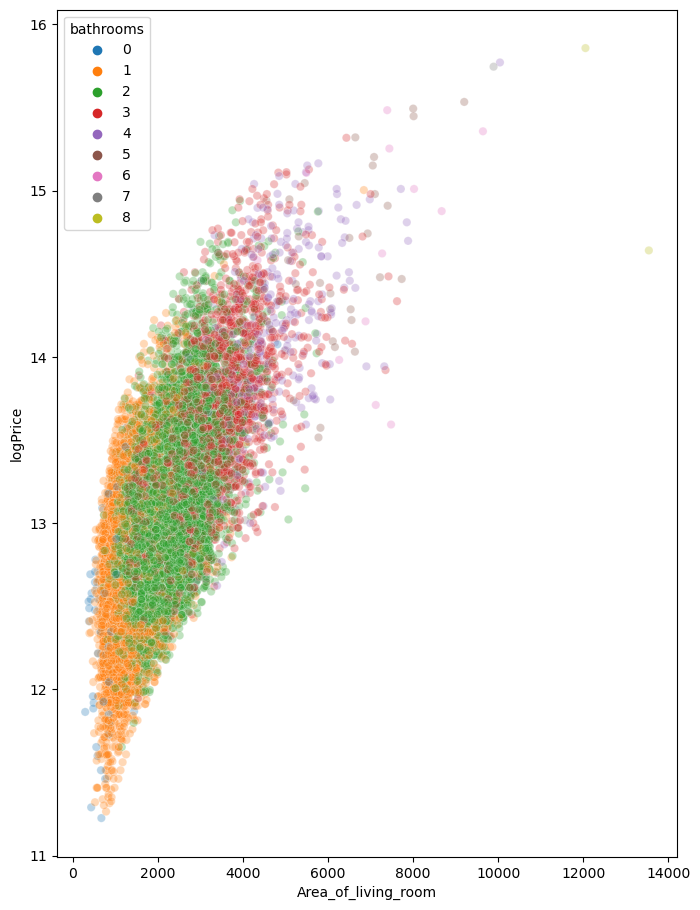

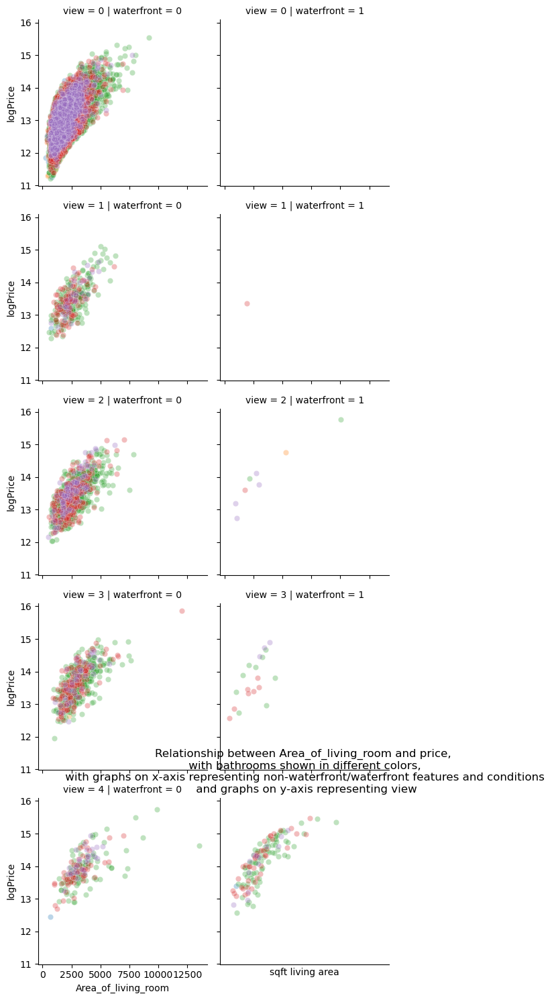

In [26]:
# Set the figure size
plt.figure(figsize=(8, 11))
# Create the scatter plot
sns.scatterplot(data=kchd, x='Area_of_living_room', y='logPrice', hue='bathrooms', palette='tab10', alpha=0.3)
# Facet the plot
g = sns.FacetGrid(kchd, row='view', col='waterfront', hue='condition')
g.map(sns.scatterplot, 'Area_of_living_room', 'logPrice', alpha=0.3)
# Set labels and title
plt.xlabel('sqft living area')
plt.ylabel('log(Price)')
plt.title('Relationship between Area_of_living_room and price, \n with bathrooms shown in different colors, \n with graphs on x-axis representing non-waterfront/waterfront features and conditions \n and graphs on y-axis representing view')
# Hide x-axis ticks and labels
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)
plt.show()


All waterfront homes have been viewed at least once, suggesting higher interest in these properties compared to those without waterfront access.
Despite their desirable location, waterfront properties do not command significantly higher prices but exhibit pricing trends similar to non-waterfront properties.
Among properties that haven't been viewed, those in better condition tend to have slightly higher prices. However, this association is not observed among viewed properties.
There is a positive correlation between the square footage of living area and the logarithm of price, indicating that larger homes tend to be priced higher.
The number of bathrooms positively correlates with price, suggesting that properties with more bathrooms tend to be more expensive.
Properties that have been viewed more frequently tend to have higher logarithmic prices, indicating that popularity or visibility influences pricing.

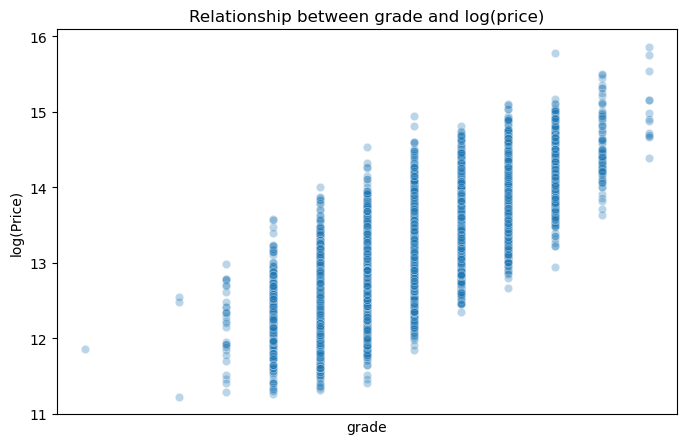

In [27]:
# Set the figure size
plt.figure(figsize=(8, 5))
# Create the scatter plot
sns.scatterplot(data=kchd, x='grade', y='logPrice', alpha=0.3)
# Set labels and title
plt.xlabel('grade')
plt.ylabel('log(Price)')
plt.title('Relationship between grade and log(price)')
# Hide x-axis ticks and labels
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)

plt.show()


The graph above confirms that log(price) and grade have a positive correlation.



are  features  better correlated with log(price/sqft_living).?

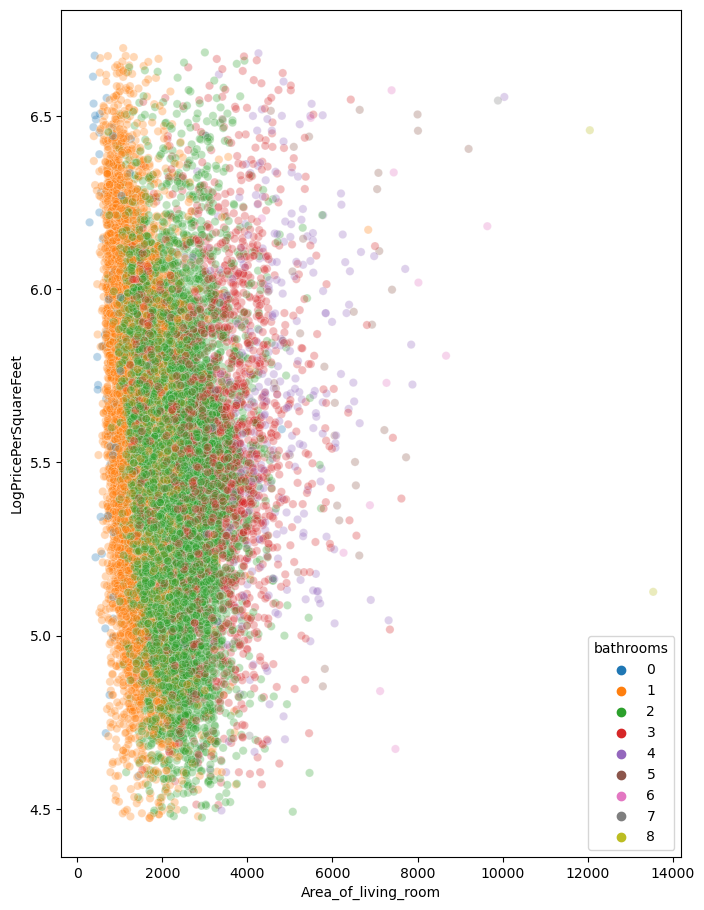

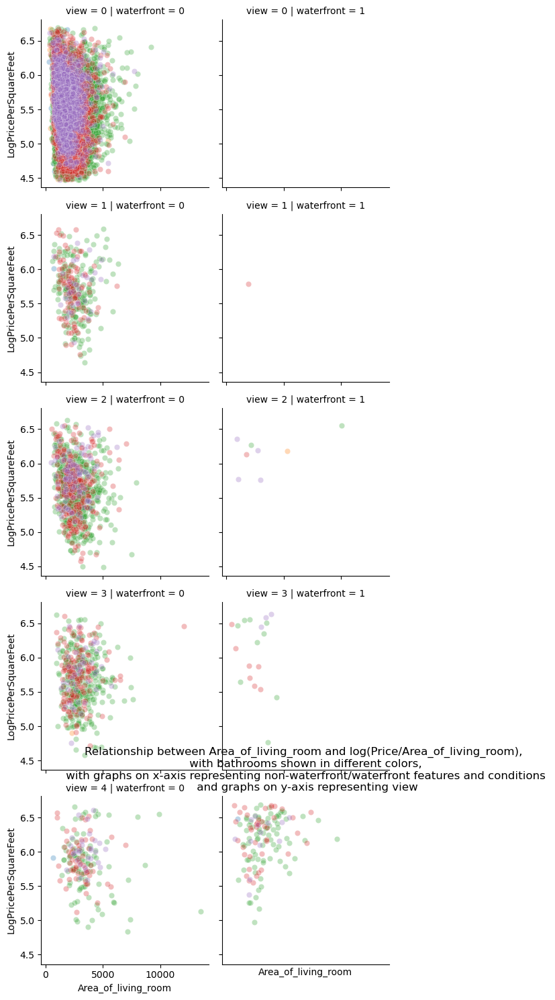

In [28]:
# Set the figure size
plt.figure(figsize=(8, 11))
# Create the scatter plot
sns.scatterplot(data=kchd, x='Area_of_living_room', y='LogPricePerSquareFeet', hue='bathrooms', palette='tab10', alpha=0.3)
# Facet the plot
g = sns.FacetGrid(kchd, row='view', col='waterfront', hue='condition')
g.map(sns.scatterplot, 'Area_of_living_room', 'LogPricePerSquareFeet', alpha=0.3)
# Set labels and title
plt.xlabel('Area_of_living_room')
plt.ylabel('log(Price/sqft_living)')
plt.title('Relationship between Area_of_living_room and log(Price/Area_of_living_room), \n with bathrooms shown in different colors, \n with graphs on x-axis representing non-waterfront/waterfront features and conditions \n and graphs on y-axis representing view')
# Hide x-axis ticks and labels
plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)

plt.show()


The graph doesn't suggest any strong connections between the price per square foot and the size of the living area. However, it does hint at a possible link between the price per square foot and the number of bedrooms. Therefore, we won't consider the price per square foot for further analysis.

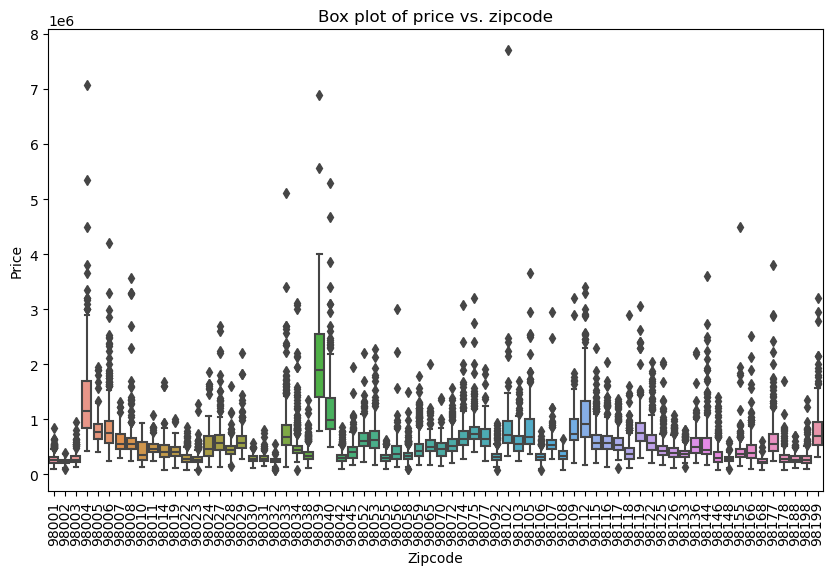

In [29]:
#Analyze the impact of zip code
# Plot boxplot of price vs. zipcode
plt.figure(figsize=(10, 6))
sns.boxplot(x=kchd['zipcode'], y=kchd['price'])
plt.xlabel('Zipcode')
plt.ylabel('Price')
plt.title('Box plot of price vs. zipcode')
plt.xticks(rotation=90)
plt.show()

<Axes: xlabel='Longitude', ylabel='Latitude'>

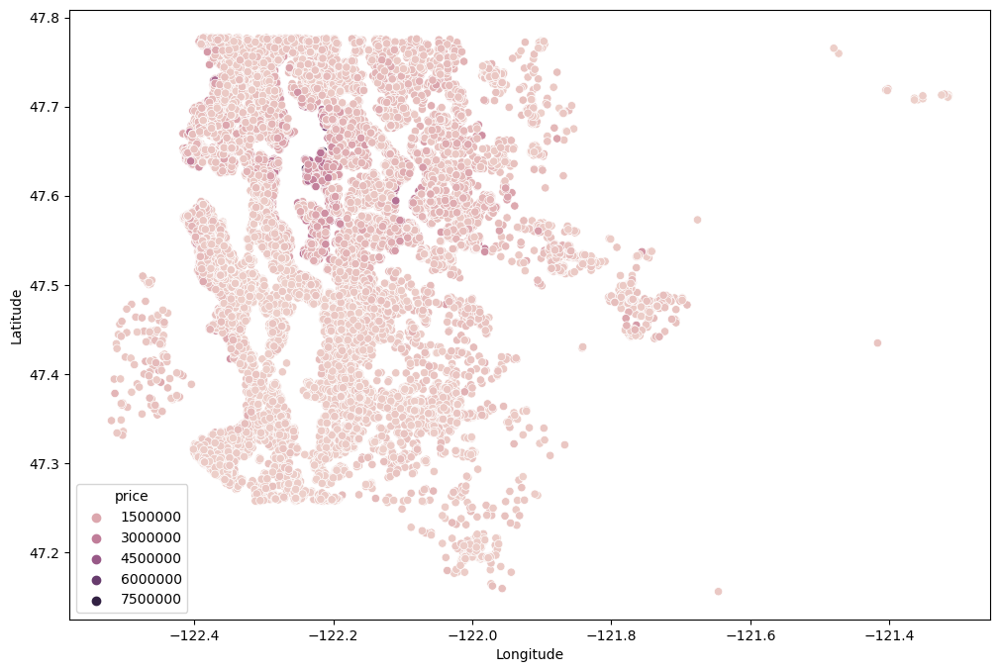

In [30]:
# Plot scatter plot of latitude and longitude
plt.figure(figsize=(12,8))
sns.scatterplot(x='Longitude',y='Latitude',data=kchd,hue='price')

Text(0.5, 1.0, ' Density price')

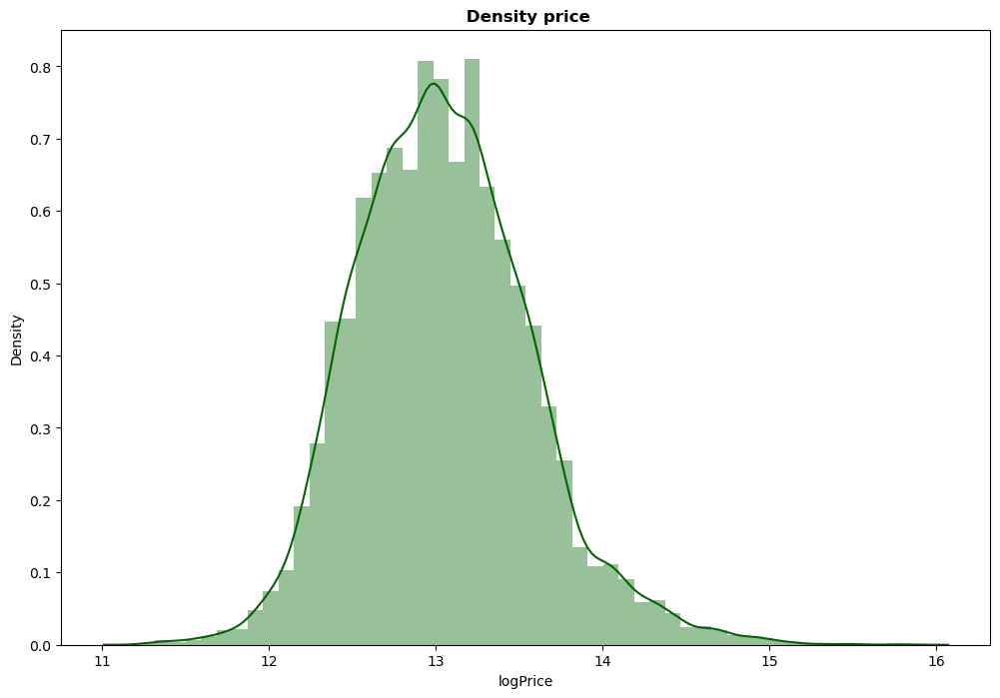

In [68]:
plt.figure(figsize=(12,8))
sns.distplot(kchd['logPrice'],color='darkgreen')
plt.title(' Density price', fontweight='bold')

The graph shows that home prices are strongly influenced by zip codes. Some zip codes have significantly lower housing prices than others. Any predictions about housing prices need to consider this variation in prices across different zip codes

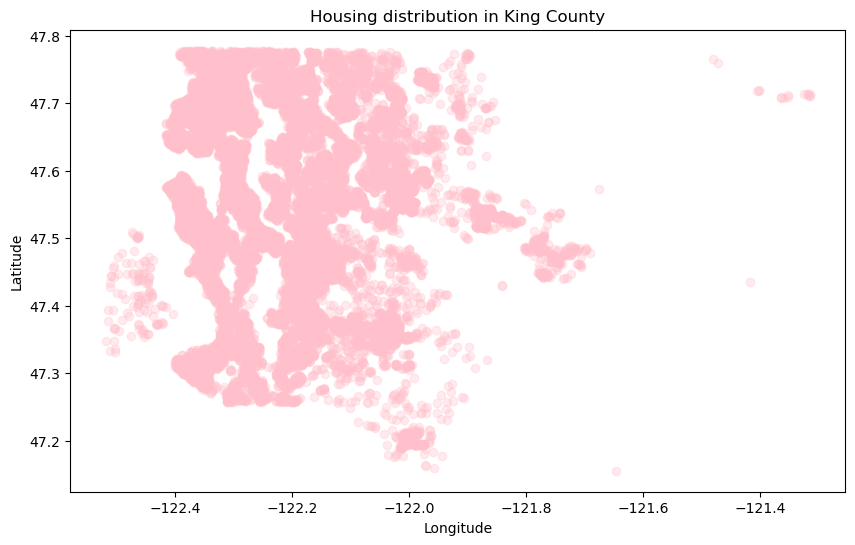

In [32]:
# Plot scatter plot of latitude and longitude
plt.figure(figsize=(10, 6))
plt.scatter(kchd['Longitude'], kchd['Latitude'], alpha=0.3,color='pink')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Housing distribution in King County')
plt.show()

In [33]:
# Perform linear regression
X = kchd[['bathrooms', 'Area_of_living_room', 'Area_of_housing_space', 'Avg Living for closest 15 houeses', 'grade', 'view', 'condition']]
y = kchd['price']

R-squared value is very low at 0.583

In [34]:
model = LinearRegression()
model.fit(X, y)
y_pred = model.predict(X)

# Calculate R-squared
r_squared = r2_score(y, y_pred)
print("R-squared:", r_squared)

R-squared: 0.5827249745180376


In [35]:
# Get the coefficients (β)
coefficients = model.coef_
intercept = model.intercept_
print("Coefficients:", coefficients)
print("Intercept:", intercept)

Coefficients: [ 9.67426968e+03  1.73195626e+02 -2.74995111e+01  8.23098967e+00
  1.02142241e+05  9.10725479e+04  5.32811321e+04]
Intercept: -789327.2772103335


In [36]:
# Calculate mean squared error (MSE), sum of squared errors (SSE), and total sum of squares (SST)
mse = mean_squared_error(y, y_pred)
sse = np.sum((y - y_pred) ** 2)
sst = np.sum((y - np.mean(y)) ** 2)
print("Mean Squared Error (MSE):", mse)
print('')

print("Sum of Squared Errors (SSE):", sse)
print('')

print("Total Sum of Squares (SST):", sst)

Mean Squared Error (MSE): 56238718181.53637

Sum of Squared Errors (SSE): 1215487416057545.5

Total Sum of Squares (SST): 2912916761921299.5


The R-squared ups to 0.79 from 0.583 if we use the mean price in the zipcode

In [37]:
# Create new variable: average price per zipcode
kchd['avgZipCodePrice'] = kchd.groupby('zipcode')['price'].transform('mean')

In [38]:
# Perform linear regression to predict log(price)
X_log = kchd[['bathrooms', 'Area_of_living_room', 'grade', 'view', 'condition', 'avgZipCodePrice']]
y_log = np.log(kchd['price'])

In [39]:
model_log = LinearRegression()
model_log.fit(X_log, y_log)
y_pred_log = model_log.predict(X_log)

In [40]:
# Calculate R-squared for log(price) prediction
r_squared_log = r2_score(y_log, y_pred_log)
print("R-squared for log(price):", r_squared_log)

R-squared for log(price): 0.7916165504596662


The R-squared jumps up to 0.828 from 0.79 if we predict log(avgZipCodePrice)

In [41]:
# Create the 'log(avgZipCodePrice)' column
kchd['log_avgZipCodePrice'] = np.log(kchd['avgZipCodePrice'])

# Remove unnecessary features and repeat linear regression for log(price)
X_log_simplified = kchd[['Area_of_living_room', 'grade', 'view', 'log_avgZipCodePrice']]
y_log = np.log(kchd['price'])

In [42]:
model_log_simplified = LinearRegression()
model_log_simplified.fit(X_log_simplified, y_log)
y_pred_log_simplified = model_log_simplified.predict(X_log_simplified)

In [43]:
model_log_simplified = LinearRegression()
model_log_simplified.fit(X_log_simplified, y_log)
y_pred_log_simplified = model_log_simplified.predict(X_log_simplified)

In [44]:
# Calculate R-squared for simplified log(price) prediction
r_squared_log_simplified = r2_score(y_log, y_pred_log_simplified)
print("R-squared for simplified log(price):", r_squared_log_simplified)

R-squared for simplified log(price): 0.8242190892159609


In [45]:
# Get the coefficients (β) and intercept
coefficients = model_log_simplified.coef_
intercept = model_log_simplified.intercept_
print("Coefficients:", coefficients)
print('')
print("Intercept:", intercept)
print('')

# Calculate mean squared error (MSE), sum of squared errors (SSE), and total sum of squares (SST)
mse = mean_squared_error(y_log, y_pred_log_simplified)
sse = np.sum((y_log - y_pred_log_simplified) ** 2)
sst = np.sum((y_log - np.mean(y_log)) ** 2)

print("Mean Squared Error (MSE):", mse)
print('')
print("Sum of Squared Errors (SSE):", sse)
print('')
print("Total Sum of Squares (SST):", sst)
print('')


Coefficients: [1.99295979e-04 9.10298165e-02 9.74886621e-02 7.16784681e-01]

Intercept: 2.510201543967243

Mean Squared Error (MSE): 0.048758767838872154

Sum of Squared Errors (SSE): 1053.823249301544

Total Sum of Squares (SST): 5995.094942910211



Text(0.5, 1.0, 'Q-Q Plot of Residuals')

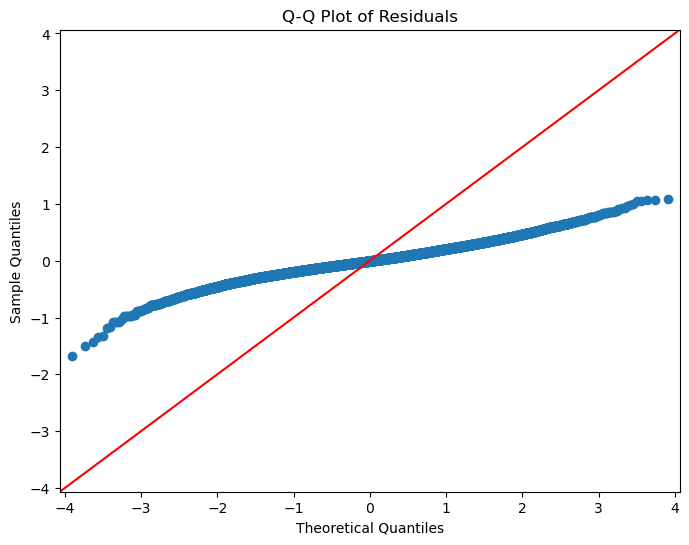

In [46]:
# Assuming you have your data in a pandas DataFrame df
X = X_log_simplified
y = y_log

# Fit the linear regression model
model = sm.OLS(y, sm.add_constant(X)).fit()

# Calculate residuals
residuals = model.resid

# Q-Q plot
fig, ax = plt.subplots(figsize=(8, 6))
sm.qqplot(residuals, line='45', ax=ax)
ax.set_title('Q-Q Plot of Residuals')


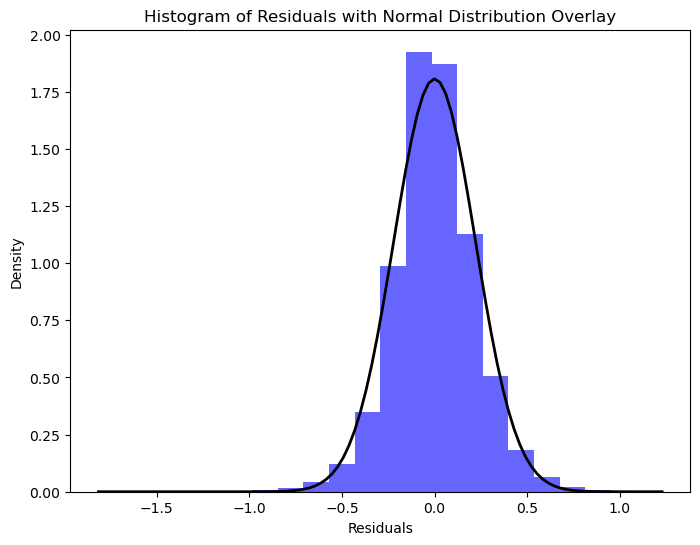

In [47]:

# Histogram
fig, ax = plt.subplots(figsize=(8, 6))
ax.hist(residuals, bins=20, density=True, alpha=0.6, color='b')
# Overlay a normal distribution curve
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, residuals.mean(), residuals.std())
ax.plot(x, p, 'k', linewidth=2)
ax.set_title('Histogram of Residuals with Normal Distribution Overlay')
ax.set_xlabel('Residuals')
ax.set_ylabel('Density')

# Show plots
plt.show()

#-our line is in middle where 
#(we expected on average that there is a linear relationship + some errors)
#- the residual(error) take the shape of normal distribution

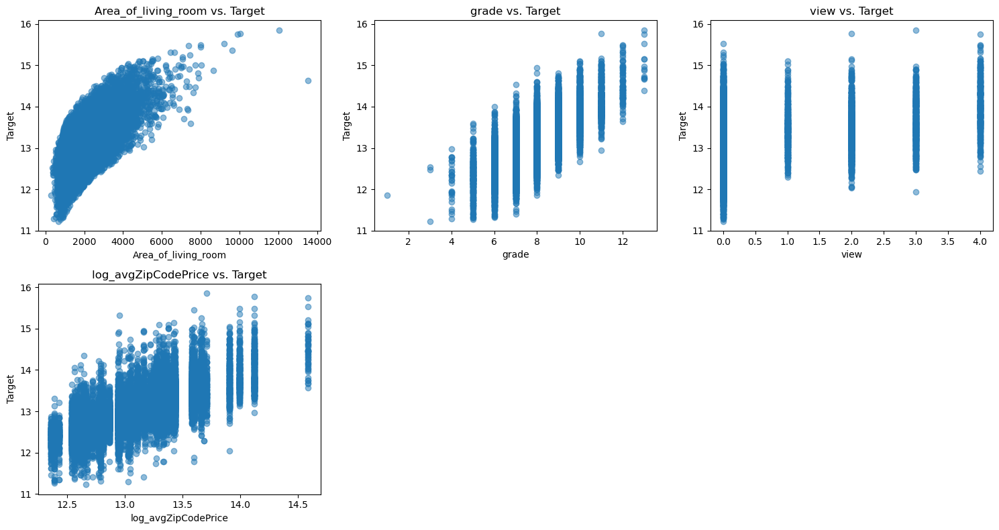

In [48]:
X = X_log_simplified
y = y_log

num_cols = X.shape[1]  # Number of independent variables

# Set the number of columns and rows for subplots
cols_per_row = 3
rows = (num_cols - 1) // cols_per_row + 1

# Create a figure and subplots
fig, axes = plt.subplots(rows, cols_per_row, figsize=(15, 4 * rows))
axes = axes.flatten()

# Iterate over each independent variable
for i, (col, ax) in enumerate(zip(X.columns, axes)):
    # Scatter plot
    ax.scatter(X[col], y, alpha=0.5)
    ax.set_title(f'{col} vs. Target')
    ax.set_xlabel(col)
    ax.set_ylabel('Target')

# Remove any unused subplots
for ax in axes[num_cols:]:
    ax.remove()

plt.tight_layout()
plt.show()

#-when plotting a figures between our target and feature we git that 
#(there is a linear reggression between each feature&the target)

In [49]:
# Assuming you have your data in a pandas DataFrame df
X =X_log_simplified

# Compute Pearson's correlation matrix
correlation_matrix = X.corr()

# Display the correlation matrix
print("Pearson's Correlation Matrix:")
print(correlation_matrix)

Pearson's Correlation Matrix:
                     Area_of_living_room     grade      view  \
Area_of_living_room             1.000000  0.762704  0.284611   
grade                           0.762704  1.000000  0.251321   
view                            0.284611  0.251321  1.000000   
log_avgZipCodePrice             0.283582  0.371502  0.101741   

                     log_avgZipCodePrice  
Area_of_living_room             0.283582  
grade                           0.371502  
view                            0.101741  
log_avgZipCodePrice             1.000000  


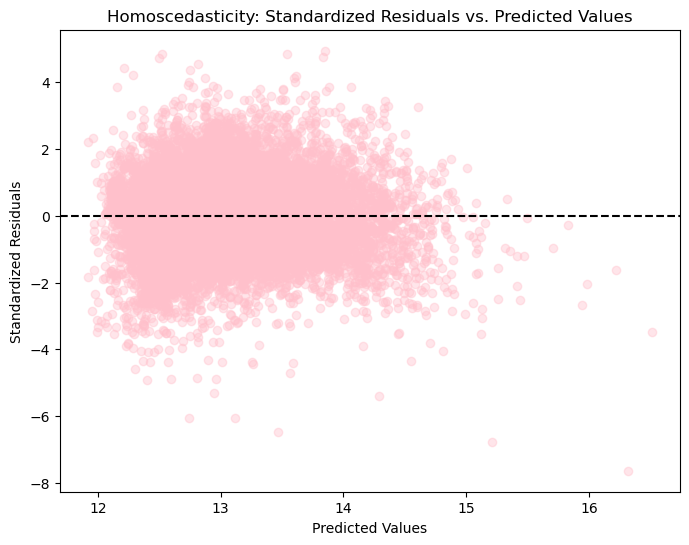

In [67]:
# Assuming you have your data in a pandas DataFrame df
X = X_log_simplified
y =y_log

# Fit the linear regression model
model = sm.OLS(y, sm.add_constant(X)).fit()

# Get the predicted values and standardized residuals
predicted_values = model.predict()
standardized_residuals = model.get_influence().resid_studentized_internal

# Create a scatter plot of standardized residuals vs. predicted values
plt.figure(figsize=(8, 6))
plt.scatter(predicted_values, standardized_residuals, alpha=0.4,color='pink')
plt.axhline(y=0, color='black', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Standardized Residuals')
plt.title('Homoscedasticity: Standardized Residuals vs. Predicted Values')
plt.show()

#-"The homoscedasticity assumes that the variance of the residual errors is similar across the value of each independent variable.
#One way of checking that is through a plot of
#the predicted values against the standardized residual values
#to see if the points are equally distributed across all the values of the independent variables."

In [51]:
# mse before fit
print("Mean Squared Error (MSE) for this model:", mean_squared_error(y, y_pred))

Mean Squared Error (MSE) for this model: 370218305667.1767


In [52]:
#second accuracy
model = ols('price ~ Area_of_living_room + grade + view + avgZipCodePrice', data=kchd).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(tabulate(anova_table, headers=["sum_sq" , "df" ,"F", "PR(>F)"], tablefmt="grid"))

+---------------------+-------------+-------+-----------+----------+
|                     |      sum_sq |    df |         F |   PR(>F) |
+=====================+=============+=======+===========+==========+
| grade               | 1.24438e+14 |    11 |   392.84  |        0 |
+---------------------+-------------+-------+-----------+----------+
| view                | 1.14955e+14 |     4 |   997.981 |        0 |
+---------------------+-------------+-------+-----------+----------+
| Area_of_living_room | 1.37464e+14 |     1 |  4773.57  |        0 |
+---------------------+-------------+-------+-----------+----------+
| avgZipCodePrice     | 4.82447e+14 |     1 | 16753.5   |        0 |
+---------------------+-------------+-------+-----------+----------+
| Residual            | 6.21867e+14 | 21595 |   nan     |      nan |
+---------------------+-------------+-------+-----------+----------+


In [53]:
#third accuracy
model = ols('logPrice ~ Area_of_living_room + grade + view + log_avgZipCodePrice', data=kchd).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(tabulate(anova_table, headers=["sum_sq" , "df" ,"F", "PR(>F)"], tablefmt="grid"))

+---------------------+----------+-------+-----------+----------+
|                     |   sum_sq |    df |         F |   PR(>F) |
+=====================+==========+=======+===========+==========+
| grade               |  103.837 |    11 |   196.171 |        0 |
+---------------------+----------+-------+-----------+----------+
| view                |  122.592 |     4 |   636.907 |        0 |
+---------------------+----------+-------+-----------+----------+
| Area_of_living_room |  297.22  |     1 |  6176.67  |        0 |
+---------------------+----------+-------+-----------+----------+
| log_avgZipCodePrice | 1488.67  |     1 | 30936.7   |        0 |
+---------------------+----------+-------+-----------+----------+
| Residual            | 1039.15  | 21595 |   nan     |      nan |
+---------------------+----------+-------+-----------+----------+


In [54]:
# mse after fit
print("Mean Squared Error (MSE) for this model:", mean_squared_error(y_log, y_pred_log_simplified))

Mean Squared Error (MSE) for this model: 0.048758767838872154


In [55]:
# partial f_ test (second accuracy)
x= kchd[['Area_of_living_room', 'grade', 'view', 'avgZipCodePrice']]
y = kchd['price']
# Using sklearn
regression = linear_model.LinearRegression()
regression.fit(x, y)
predictions_sklearn = regression.predict(x)
print("Intercept: \n", regression.intercept_)
print('')
print("Coefficients: \n", regression.coef_)

Intercept: 
 -540723.1364849595

Coefficients: 
 [1.60154692e+02 4.55780440e+04 9.68774173e+04 6.96222588e-01]


In [56]:
# Using statsmodels
x = sm.add_constant(x)
model = sm.OLS(y, x).fit()
predictions_statsmodels = model.predict(x)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.743
Model:                            OLS   Adj. R-squared:                  0.743
Method:                 Least Squares   F-statistic:                 1.559e+04
Date:                Thu, 09 May 2024   Prob (F-statistic):               0.00
Time:                        06:17:43   Log-Likelihood:            -2.9294e+05
No. Observations:               21613   AIC:                         5.859e+05
Df Residuals:                   21608   BIC:                         5.859e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -5.407e+05   9

In [57]:
# partial f_ test (second accuracy)
x= kchd[['Area_of_living_room', 'grade', 'view', 'log_avgZipCodePrice']]
y = kchd['logPrice']
# Using sklearn
regression = linear_model.LinearRegression()
regression.fit(x, y)
predictions_sklearn = regression.predict(x)
print("Intercept: \n", regression.intercept_)
print('')
print("Coefficients: \n", regression.coef_)

Intercept: 
 2.510201543967243

Coefficients: 
 [1.99295979e-04 9.10298165e-02 9.74886621e-02 7.16784681e-01]


In [58]:
# Using statsmodels
x = sm.add_constant(x)
model = sm.OLS(y, x).fit()
predictions_statsmodels = model.predict(x)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:               logPrice   R-squared:                       0.824
Model:                            OLS   Adj. R-squared:                  0.824
Method:                 Least Squares   F-statistic:                 2.533e+04
Date:                Thu, 09 May 2024   Prob (F-statistic):               0.00
Time:                        06:17:43   Log-Likelihood:                 1977.5
No. Observations:               21613   AIC:                            -3945.
Df Residuals:                   21608   BIC:                            -3905.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   2.5102    

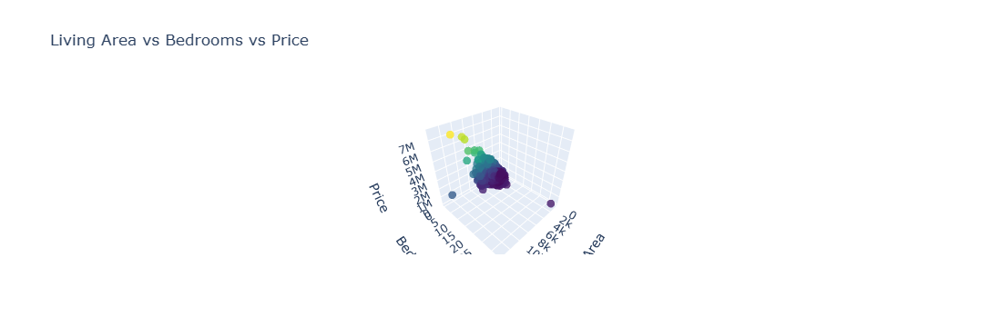

In [59]:
import plotly.graph_objects as go
fig2 = go.Figure(data=[go.Scatter3d(
    x=kchd['Area_of_living_room'],
    y=kchd['bedrooms'],
    z=kchd['price'],
    mode='markers',
    marker=dict(
        size=5,
        color=kchd['price'],
        colorscale='Viridis',
        opacity=0.8
    )
)])

fig2.update_layout(scene=dict(
                    xaxis_title='Living Area',
                    yaxis_title='Bedrooms',
                    zaxis_title='Price'),
                    title='Living Area vs Bedrooms vs Price')
fig2.show()

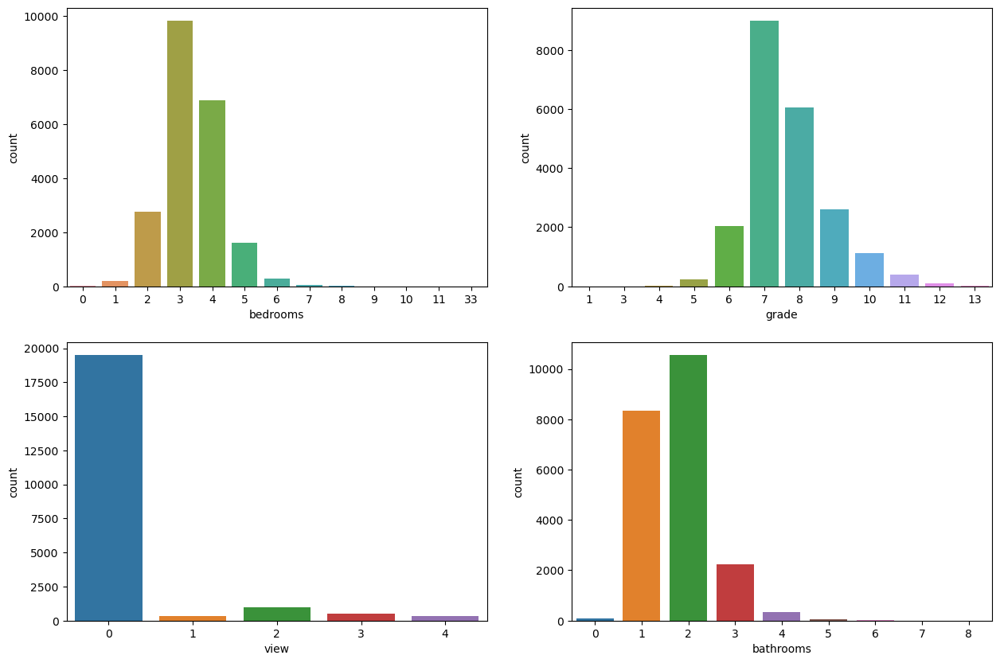

In [73]:
fig, ax = plt.subplots(2, 2, figsize=(15, 10))
sns.countplot(x='bedrooms', data=kchd, ax=ax[0, 0])
sns.countplot(x='bathrooms', data=kchd, ax=ax[1, 1])
sns.countplot(x='view', data=kchd, ax=ax[1, 0])
sns.countplot(x='grade', data=kchd, ax=ax[0, 1])
plt.show()

In [ ]:
import tkinter as tk
from tkinter import ttk, messagebox
from sklearn.metrics import r2_score, mean_squared_error

# Read the housing data
kchd = pd.read_csv('kc_house_data.csv')
kchd['avgZipCodePrice'] = kchd.groupby('zipcode')['price'].transform('mean')
kchd['log_avgZipCodePrice'] = np.log(kchd['avgZipCodePrice'])
kchd['logPrice'] = np.log(kchd['price'])
kchd['LogPricePerSquareFeet'] = np.log(kchd['price'] / kchd['sqft_living'])
X_log_simplified = kchd[['sqft_living', 'grade', 'view', 'log_avgZipCodePrice']]
y_log = np.log(kchd['price'])


def calculate_average_correlation_matrix():
    # Calculate correlation matrix
    vars_for_correlation = ["price", "bedrooms", "bathrooms", 'sqft_living', "sqft_lot", "yr_built", "yr_renovated", "sqft_above", "sqft_basement", "sqft_living15", "sqft_lot15"]

    # Calculate correlation matrix
    correlation_matrix = kchd[vars_for_correlation].corr()
    # Display correlation matrix in a messagebox
    messagebox.showinfo("Correlation Matrix", str(correlation_matrix))

def calculate_average_correlation_matrix_2():

    vars_for_correlation_2 = ["price","logPrice","LogPricePerSquareFeet", "bedrooms", "bathrooms", "sqft_living", "sqft_lot", "yr_built", "yr_renovated", "sqft_above", "sqft_basement", "sqft_living15", "sqft_lot15"]

    # Calculate correlation matrix
    correlation_matrix_2 = kchd[vars_for_correlation_2].corr()
    messagebox.showinfo("Correlation Matrix", str(correlation_matrix_2))



def create_additional_variables():
    # Create additional variables
    kchd['logPrice'] = np.log(kchd['price'])
    kchd['LogPricePerSquareFeet'] = np.log(kchd['price'] / kchd['sqft_living'])
    messagebox.showinfo("Variables Created", "Additional variables have been created.")

def countplot() :
   fig, ax = plt.subplots(2, 2, figsize=(15, 10))
   sns.countplot(x='bedrooms', data=kchd, ax=ax[0, 0])
   sns.countplot(x='bathrooms', data=kchd, ax=ax[1, 1])
   sns.countplot(x='view', data=kchd, ax=ax[1, 0])
   sns.countplot(x='grade', data=kchd, ax=ax[0, 1])
   plt.show()

def plot_boxplot():
    # Plot boxplot of price vs. zipcode
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=kchd['zipcode'], y=kchd['price'])
    plt.xlabel('Zipcode')
    plt.ylabel('Price')
    plt.title('Box plot of price vs. zipcode')
    plt.xticks(rotation=90)
    plt.show()

def plot_scatter():
    # Plot scatter plot of latitude and longitude
    plt.figure(figsize=(10, 6))
    plt.scatter(kchd['long'], kchd['lat'], alpha=0.3)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Housing distribution in King County')
    plt.show()

def d_graph() :
    fig2 = go.Figure(data=[go.Scatter3d(
    x=kchd['sqft_living'],
    y=kchd['bedrooms'],
    z=kchd['price'],
    mode='markers',
    marker=dict(
        size=5,
        color=kchd['price'],
        colorscale='Viridis',
        opacity=0.8
    )
    )])

    fig2.update_layout(scene=dict(
                    xaxis_title='Living Area',
                    yaxis_title='Bedrooms',
                    zaxis_title='Price'),
                    title='Living Area vs Bedrooms vs Price')
    fig2.show()

def qqplot_histo():
    X = X_log_simplified
    y = y_log

    # Fit the linear regression model
    model = sm.OLS(y, sm.add_constant(X)).fit()

   # Calculate residuals
    residuals = model.resid

   # Q-Q plot
    fig, ax = plt.subplots(figsize=(8, 6))
    sm.qqplot(residuals, line='45', ax=ax)
    ax.set_title('Q-Q Plot of Residuals')

   # Histogram
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.hist(residuals, bins=20, density=True, alpha=0.6, color='b')
# Overlay a normal distribution curve
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = stats.norm.pdf(x, residuals.mean(), residuals.std())
    ax.plot(x, p, 'k', linewidth=2)
    ax.set_title('Histogram of Residuals with Normal Distribution Overlay')
    ax.set_xlabel('Residuals')
    ax.set_ylabel('Density')
    
    # Show plots
    plt.show()
         

def scatter_plot():
    X = X_log_simplified
    y =y_log
    
    # Fit the linear regression model
    model = sm.OLS(y, sm.add_constant(X)).fit()
    
    # Get the predicted values and standardized residuals
    predicted_values = model.predict()
    standardized_residuals = model.get_influence().resid_studentized_internal
    
    # Create a scatter plot of standardized residuals vs. predicted values
    plt.figure(figsize=(8, 6))
    plt.scatter(predicted_values, standardized_residuals, alpha=0.4,color='pink')
    plt.axhline(y=0, color='black', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Standardized Residuals')
    plt.title('Homoscedasticity: Standardized Residuals vs. Predicted Values')
    plt.show()

def scatter():
    plt.figure(figsize=(8, 5))

    # Create the scatter plot
    sns.scatterplot(data=kchd, x='grade', y='logPrice', alpha=0.3)

    # Set labels and title
    plt.xlabel('grade')
    plt.ylabel('log(Price)')
    plt.title('Relationship between grade and log(price)')

    # Hide x-axis ticks and labels
    plt.tick_params(axis='x', which='both', bottom=False, labelbottom=False)

    plt.show()

def scatt():
    plt.figure(figsize=(12,8))
    sns.scatterplot(x='long',y='lat',data=kchd,hue='price')
    plt.show()

def target():
    X = X_log_simplified
    y = y_log
    
    num_cols = X.shape[1]  # Number of independent variables
    
    # Set the number of columns and rows for subplots
    cols_per_row = 3
    rows = (num_cols - 1) // cols_per_row + 1
    
    # Create a figure and subplots
    fig, axes = plt.subplots(rows, cols_per_row, figsize=(15, 4 * rows))
    axes = axes.flatten()
    
    # Iterate over each independent variable
    for i, (col, ax) in enumerate(zip(X.columns, axes)):
        # Scatter plot
        ax.scatter(X[col], y, alpha=0.5)
        ax.set_title(f'{col} vs. Target')
        ax.set_xlabel(col)
        ax.set_ylabel('Target')
    
    # Remove any unused subplots
    for ax in axes[num_cols:]:
        ax.remove()
    
    plt.tight_layout()
    plt.show()

def density():
    plt.figure(figsize=(12,8))
    sns.distplot(kchd['logPrice'],color='darkgreen')
    plt.title(' Density price', fontweight='bold')
    plt.show()

def pairplot_1():
    vars1 = ['price', 'date', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view']


    sns.pairplot(kchd[vars1])
    plt.show()

def pairplot_2():
    vars2 = ['price', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15', 'sqft_lot15']

    # Plot the second subset of variables
    sns.pairplot(kchd[vars2])
    plt.show()

def pairplot_3():
    # Select the variables for plotting
    vars_to_plot = ["sqft_living", "sqft_lot", "sqft_above", "sqft_basement", "sqft_living15", "sqft_lot15"]
    
    # Create pairplot for selected variables
    sns.pairplot(kchd[vars_to_plot])
    plt.show()


def perform_linear_regression():
    # Perform linear regression
    X = kchd[['bathrooms', 'sqft_living', 'sqft_above', 'sqft_living15', 'grade', 'view', 'condition']]
    y = kchd['price']
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)

    # Calculate R-squared
    r_squared = r2_score(y, y_pred)
    messagebox.showinfo("Linear Regression", f"R-squared: {r_squared}")

def calculate_second_accuracy():
    # Perform OLS regression
    model = ols('price ~ sqft_living + grade + view + avgZipCodePrice', data=kchd).fit()
    # Compute ANOVA table
    anova_table = sm.stats.anova_lm(model, typ=2)
    # Display ANOVA table in a messagebox
    result_text = tabulate(anova_table, headers=["sum_sq", "df", "F", "PR(>F)"], tablefmt="grid")
    messagebox.showinfo("Second Accuracy Result", result_text)

def calculate_third_accuracy():
    # Perform OLS regression
    model = ols('logPrice ~ sqft_living + grade + view + log_avgZipCodePrice', data=kchd).fit()
    # Compute ANOVA table
    anova_table = sm.stats.anova_lm(model, typ=2)
    # Display ANOVA table in a messagebox
    result_text = tabulate(anova_table, headers=["sum_sq", "df", "F", "PR(>F)"], tablefmt="grid")
    messagebox.showinfo("Third Accuracy Result", result_text)

def calculate_mse_before_fit():
    # Perform linear regression
    X = kchd[['bathrooms', 'sqft_living', 'sqft_above', 'sqft_living15', 'grade', 'view', 'condition']]
    y = kchd['price']
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)

    # Calculate mean squared error
    mse = mean_squared_error(y, y_pred)
    messagebox.showinfo("Mean Squared Error (MSE) before Fit", f"MSE: {mse}")

def calculate_mse_after_fit():
    # Perform linear regression
    X_log_simplified = kchd[['sqft_living', 'grade', 'view', 'log_avgZipCodePrice']]
    y_log = kchd['logPrice']
    model_log_simplified = LinearRegression()
    model_log_simplified.fit(X_log_simplified, y_log)
    y_pred_log_simplified = model_log_simplified.predict(X_log_simplified)

    # Calculate mean squared error
    mse = mean_squared_error(y_log, y_pred_log_simplified)
    messagebox.showinfo("Mean Squared Error (MSE) after Fit", f"MSE: {mse}")

def partial_f_test_second_accuracy():
    # Perform linear regression
    x = kchd[['sqft_living', 'grade', 'view', 'avgZipCodePrice']]
    y = kchd['price']
    regression = LinearRegression()
    regression.fit(x, y)

    # Using statsmodels
    x = sm.add_constant(x)
    model = sm.OLS(y, x).fit()
    summary = model.summary()

    # Display summary in a messagebox
    messagebox.showinfo("Partial F-Test (Second Accuracy)", summary)

def partial_f_test_third_accuracy():
    # Perform linear regression
    x = kchd[['sqft_living', 'grade', 'view', 'log_avgZipCodePrice']]
    y = kchd['logPrice']
    
    # Using sklearn
    regression = linear_model.LinearRegression()
    regression.fit(x, y)
    predictions_sklearn = regression.predict(x)

    # Using statsmodels
    x = sm.add_constant(x)
    model = sm.OLS(y, x).fit()
    summary = model.summary()

    # Display summary in a messagebox
    messagebox.showinfo("Partial F-Test (Third Accuracy)", summary)

root = tk.Tk()
root.title("Housing Data Analysis")

# Define colors for the theme
background_color = "#000"  # black
button_color = "#000"  # black
button_hover_color = "#000"  # black
button_text_color = "purple"

# Configure root window
root.configure(bg=background_color)

# Configure style for buttons
style = ttk.Style(root)
style.configure('Custom.TButton', background=button_color, foreground=button_text_color)
style.map('Custom.TButton', background=[('active', button_hover_color)])

# Grid layout for buttons
row = 0

correlation_button = ttk.Button(root, text="Correlation Average Matrix", command=calculate_average_correlation_matrix,
                                style='Custom.TButton')
correlation_button.grid(row=row, column=0, padx=10, pady=5)

correlation_button = ttk.Button(root, text="Correlation Average Matrix update", command=calculate_average_correlation_matrix_2,
                                style='Custom.TButton')
correlation_button.grid(row=row, column=1, padx=10, pady=5)



create_variables_button = ttk.Button(root, text="Create Additional Variables", command=create_additional_variables,
                                     style='Custom.TButton')
create_variables_button.grid(row=row, column=2, padx=10, pady=5)

boxplot_button = ttk.Button(root, text="Plot Boxplot of Price vs. Zipcode", command=plot_boxplot,
                            style='Custom.TButton')
boxplot_button.grid(row=row, column=3, padx=10, pady=5)

row += 1

scatter_button = ttk.Button(root, text="Plot Scatter Plot of Latitude and Longitude", command=plot_scatter,
                            style='Custom.TButton')
scatter_button.grid(row=row, column=0, padx=10, pady=5)

linear_regression_button = ttk.Button(root, text="Perform Linear Regression", command=perform_linear_regression,
                                      style='Custom.TButton')
linear_regression_button.grid(row=row, column=1, padx=10, pady=5)

second_accuracy_button = ttk.Button(root, text="Calculate Second Accuracy", command=calculate_second_accuracy,
                                    style='Custom.TButton')
second_accuracy_button.grid(row=row, column=2, padx=10, pady=5)

scatter_button = ttk.Button(root, text="multi graph", command=countplot,
                            style='Custom.TButton')
scatter_button.grid(row=row, column=3, padx=10, pady=5)


row += 1

third_accuracy_button = ttk.Button(root, text="Calculate Third Accuracy", command=calculate_third_accuracy,
                                   style='Custom.TButton')
third_accuracy_button.grid(row=row, column=0, padx=10, pady=5)

mse_before_fit_button = ttk.Button(root, text="Calculate MSE before Fit", command=calculate_mse_before_fit,
                                   style='Custom.TButton')
mse_before_fit_button.grid(row=row, column=1, padx=10, pady=5)

mse_after_fit_button = ttk.Button(root, text="Calculate MSE after Fit", command=calculate_mse_after_fit,
                                  style='Custom.TButton')
mse_after_fit_button.grid(row=row, column=2, padx=10, pady=5)

scatter_button = ttk.Button(root, text="3D graph", command=d_graph,
                            style='Custom.TButton')
scatter_button.grid(row=row, column=3, padx=10, pady=5)


row += 1

partial_f_test_second_accuracy_button = ttk.Button(root, text="Partial F-Test (Second Accuracy)",
                                                   command=partial_f_test_second_accuracy,
                                                   style='Custom.TButton')
partial_f_test_second_accuracy_button.grid(row=row, column=0, padx=10, pady=5)

partial_f_test_third_accuracy_button = ttk.Button(root, text="Partial F-Test (Third Accuracy)",
                                                  command=partial_f_test_third_accuracy,
                                                  style='Custom.TButton')
partial_f_test_third_accuracy_button.grid(row=row, column=1, padx=10, pady=5)

qq_plot_button = ttk.Button(root, text="Q_Q Plot & Histogram E", command=qqplot_histo,
                            style='Custom.TButton')
qq_plot_button.grid(row=row, column=2, padx=10, pady=5)

scatter_button = ttk.Button(root, text="Plot Scatter Plot of Standard and Predict", command=scatter_plot,
                            style='Custom.TButton')
scatter_button.grid(row=row, column=3, padx=10, pady=5)


row += 1

scatter_button = ttk.Button(root, text="Plot Scatter Plot of logprice and grade", command=scatter,
                            style='Custom.TButton')
scatter_button.grid(row=row, column=0, padx=10, pady=5)

scatter_button = ttk.Button(root, text="Latitude and Longitude(price)", command=scatt,
                            style='Custom.TButton')
scatter_button.grid(row=row, column=1, padx=10, pady=5)

density_button = ttk.Button(root, text="Density Price", command=density,
                            style='Custom.TButton')
density_button.grid(row=row, column=2, padx=10, pady=5)

scatter_button = ttk.Button(root, text="some columns and target", command=target,
                            style='Custom.TButton')
scatter_button.grid(row=row, column=3, padx=10, pady=5)


row += 1

pair_button = ttk.Button(root, text="Sample_1", command=pairplot_1,
                            style='Custom.TButton')
pair_button.grid(row=row, column=0, padx=10, pady=5)

pair_button = ttk.Button(root, text="Sample_2", command=pairplot_2,
                            style='Custom.TButton')
pair_button.grid(row=row, column=1, padx=10, pady=5)

pair_button = ttk.Button(root, text="Sample_3", command=pairplot_3,
                            style='Custom.TButton')
pair_button.grid(row=row, column=2, padx=10, pady=5)

root.mainloop()